In [21]:
#### IMPORT LIBRARIES ####
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import fiona as fn

In [22]:
# load dengue dataset
data = pd.read_csv("ph_dengue.csv")

In [23]:
data.head()

,Month,Year,Region,MTD_Cases,MTD_Deaths
0,Jan,2019,Region I,411,1
1,Jan,2019,Region II,357,10
2,Jan,2019,Region III,1219,2
3,Jan,2019,Region IV-A,1903,4
4,Jan,2019,MIMAROPA,296,0


In [24]:
data.shape

(136, 5)

In [25]:
data.columns

Index(['Month', 'Year', 'Region', 'MTD_Cases', 'MTD_Deaths'], dtype='object')

In [26]:
# load shapefile of Philippines
ph_shape = gpd.read_file("ph_shapefile/Regions.shp")
ph_shape

,REGION,geometry
0,Autonomous Region of Muslim Mindanao (ARMM),"MULTIPOLYGON (((119.46694 4.58694, 119.46639 4..."
1,Bicol Region (Region V),"MULTIPOLYGON (((122.98417 11.71056, 122.98333 ..."
2,CALABARZON (Region IV-A),"MULTIPOLYGON (((125.22166 10.43444, 125.22195 ..."
3,Cagayan Valley (Region II),"MULTIPOLYGON (((122.47040 16.91995, 122.47040 ..."
4,Caraga (Region XIII),"MULTIPOLYGON (((126.41750 7.96417, 126.41778 7..."
5,Central Luzon (Region III),"MULTIPOLYGON (((120.62363 14.36788, 120.62368 ..."
6,Central Visayas (Region VII),"MULTIPOLYGON (((123.27111 9.08476, 123.27173 9..."
7,Cordillera Administrative Region (CAR),"POLYGON ((121.37679 17.95473, 121.36825 17.939..."
8,Davao Region (Region XI),"MULTIPOLYGON (((125.39778 5.43583, 125.39778 5..."
9,Eastern Visayas (Region VIII),"MULTIPOLYGON (((125.07361 9.89472, 125.07333 9..."


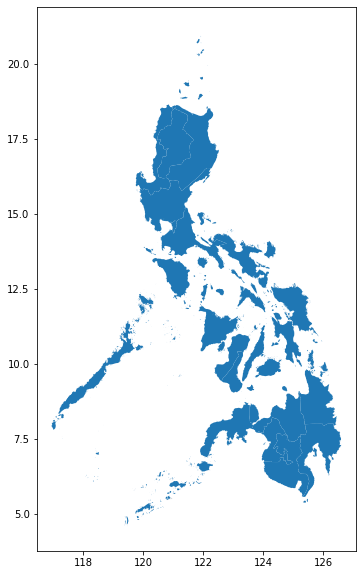

In [27]:
# Check plot of shapefile
plt.rcParams['figure.figsize'] = [20, 10] 
ph_shape.plot()

In [28]:
ph_shape.columns

Index(['REGION', 'geometry'], dtype='object')

In [29]:
# Rename all regions for easier reference and to match with the region column in the cases dataframe
ph_shape['REGION'] = ph_shape['REGION'].apply({'Ilocos Region (Region I)': 'Region I',
 'Cagayan Valley (Region II)': 'Region II',
 'Central Luzon (Region III)': 'Region III',
 'CALABARZON (Region IV-A)': 'Region IV-A',
 'MIMAROPA (Region IV-B)': 'MIMAROPA',
 'Bicol Region (Region V)': 'Region V',
 'Western Visayas (Region VI)': 'Region VI',
 'Central Visayas (Region VII)': 'Region VII',
 'Eastern Visayas (Region VIII)': 'Region VIII',
 'Zamboanga Peninsula (Region IX)': 'Region IX',
 'Northern Mindanao (Region X)': 'Region X',
 'Davao Region (Region XI)': 'Region XI',
 'SOCCSKSARGEN (Region XII)': 'Region XII',
 'Autonomous Region of Muslim Mindanao (ARMM)': 'ARMM',
 'Cordillera Administrative Region (CAR)': 'CAR',
 'Caraga (Region XIII)': 'CARAGA',
 'Metropolitan Manila': 'NCR'}.get)

In [30]:
# Also, rename the region column
ph_shape =ph_shape.rename(columns = {'REGION': 'Region'})
ph_shape

,Region,geometry
0,ARMM,"MULTIPOLYGON (((119.46694 4.58694, 119.46639 4..."
1,Region V,"MULTIPOLYGON (((122.98417 11.71056, 122.98333 ..."
2,Region IV-A,"MULTIPOLYGON (((125.22166 10.43444, 125.22195 ..."
3,Region II,"MULTIPOLYGON (((122.47040 16.91995, 122.47040 ..."
4,CARAGA,"MULTIPOLYGON (((126.41750 7.96417, 126.41778 7..."
5,Region III,"MULTIPOLYGON (((120.62363 14.36788, 120.62368 ..."
6,Region VII,"MULTIPOLYGON (((123.27111 9.08476, 123.27173 9..."
7,CAR,"POLYGON ((121.37679 17.95473, 121.36825 17.939..."
8,Region XI,"MULTIPOLYGON (((125.39778 5.43583, 125.39778 5..."
9,Region VIII,"MULTIPOLYGON (((125.07361 9.89472, 125.07333 9..."


In [31]:
# Merge cases and shapefile into one dataframe for analysis
merged_dengue_shape = pd.merge(data, ph_shape, on= ['Region'])

In [32]:
merged_dengue_shape.head()

,Month,Year,Region,MTD_Cases,MTD_Deaths,geometry
0,Jan,2019,Region I,411,1,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
1,Feb,2019,Region I,827,2,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
2,Mar,2019,Region I,1234,2,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
3,Apr,2019,Region I,1426,3,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
4,May,2019,Region I,1636,3,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."


In [33]:
luzon = merged_dengue_shape[merged_dengue_shape.Region.isin(['NCR', 'Region I', 'Region II', 'Region III', 
                                                            'Region IV-A', 'MIMAROPA', 'Region V', 'CAR'])]
luzon.head(10)

,Month,Year,Region,MTD_Cases,MTD_Deaths,geometry
0,Jan,2019,Region I,411,1,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
1,Feb,2019,Region I,827,2,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
2,Mar,2019,Region I,1234,2,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
3,Apr,2019,Region I,1426,3,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
4,May,2019,Region I,1636,3,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
5,Jun,2019,Region I,2516,5,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
6,Jul,2019,Region I,5169,10,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
7,Aug,2019,Region I,10892,25,"MULTIPOLYGON (((119.86505 15.81170, 119.86479 ..."
8,Jan,2019,Region II,357,10,"MULTIPOLYGON (((122.47040 16.91995, 122.47040 ..."
9,Feb,2019,Region II,2810,17,"MULTIPOLYGON (((122.47040 16.91995, 122.47040 ..."


In [34]:
luzon.shape

(64, 6)

In [35]:
import math

import json

from bokeh.io import output_notebook, show, output_file
from bokeh.plotting import figure
from bokeh.models import GeoJSONDataSource, LinearColorMapper, ColorBar, NumeralTickFormatter
from bokeh.palettes import brewer

from bokeh.io.doc import curdoc
from bokeh.models import Slider, HoverTool, Select
from bokeh.layouts import widgetbox, row, column

In [36]:
# This dictionary contains the formatting for the data in the plots
format_data = [('MTD_Cases', 50, 45500,'0,0', 'Month-To-Date Dengue Cases'),
               ('MTD_Deaths', 0, 250,'0,0', 'Month-To-Date Dengue Deaths')]              
 
#Create a DataFrame object from the dictionary 
format_df = pd.DataFrame(format_data, columns = ['field' , 'min_range', 'max_range' , 'format', 'verbage'])
format_df.head()

,field,min_range,max_range,format,verbage
0,MTD_Cases,0,45000,"0,0",Month-To-Date Dengue Cases
1,MTD_Deaths,0,1200,"0,0",Month-To-Date Dengue Deaths


In [37]:
def json_data(selected_month):
    month_dict = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5: 'May',  6: 'Jun',  7: 'Jul',  8: 'Aug'}
#     mo = month_dict[selected_month]
    
    # Filter by selected month 
    filtered = luzon[luzon['Month']==month_dict[selected_month]]
    
    # Convert filtered data by month into a Geodataframe object
    filtered_gpd = gpd.GeoDataFrame(filtered)

    # Bokeh uses geojson formatting, representing geographical features, with json
    # Convert to json
    filtered_json = json.loads(filtered_gpd.to_json())
    
    # Convert to json preferred string-like object 
    json_data = json.dumps(filtered_json)
    return json_data

In [38]:
# Define the callback function: update_plot
def update_plot(attr, old, new):
    # The input month is the month selected from the slider
    select_month = slider.value
    new_data = json_data(select_month)
    
    # The input cr is the dengue reports selected from the select box
    cr = select.value
    input_field = format_df.loc[format_df['verbage'] == cr, 'field'].iloc[0]
    
    # Update the plot based on the changed inputs
    p = make_plot(input_field)
    
    # Update the layout, clear the old document and display the new document
    layout = column(p, widgetbox(select), widgetbox(slider))
    curdoc().clear()
    curdoc().add_root(layout)
    
    # Update the data
    geosource.geojson = new_data

In [39]:
# Create a plotting function
def make_plot(field_name):    
    # Set the format of the colorbar
    min_range = format_df.loc[format_df['field'] == field_name, 'min_range'].iloc[0]
    max_range = format_df.loc[format_df['field'] == field_name, 'max_range'].iloc[0]
    field_format = format_df.loc[format_df['field'] == field_name, 'format'].iloc[0]

      # Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
    color_mapper = LinearColorMapper(palette = palette, low = min_range, high = max_range)

      # Create color bar.
    format_tick = NumeralTickFormatter(format=field_format)
    color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8, formatter=format_tick,
    border_line_color=None, location = (0, 0))

      # Create figure object.
    verbage = format_df.loc[format_df['field'] == field_name, 'verbage'].iloc[0]

    p = figure(title = verbage + ' in the Philippines by period - January - August 2019', 
                 plot_height = 850, plot_width = 1050,
                 toolbar_location = None)
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    p.axis.visible = False

      # Add patch renderer to figure. 
    p.patches('xs','ys', source = geosource, fill_color = {'field' : field_name, 'transform' : color_mapper},
              line_color = 'black', line_width = 0.25, fill_alpha = 1)

      # Specify color bar layout.
    p.add_layout(color_bar, 'right')

      # Add the hover tool to the graph
    p.add_tools(hover)
    return p

In [40]:
# Input geojson source that contains features for plotting for:
# initial month- August and initial criteria- Month-To-Date Cases
geosource = GeoJSONDataSource(geojson = json_data(8))
input_field ='MTD_Cases'

# Define a sequential multi-hue color palette.
palette = brewer['YlOrBr'][8]

# Reverse color order so that dark blue is highest count
palette = palette[::-1]

# Add hover tool

hover = HoverTool(tooltips = [ ('Location', '@Region'),
                               ('Month-To-Date Dengue Cases', '@MTD_Cases'),
                               ('Month-To-Date Dengue Deaths', '@MTD_Deaths')])
# Call the plotting function
p = make_plot(input_field)

# Make a slider object: slider 
slider = Slider(title = 'Select Month', start = 1, end = 8, step = 1, value = 8)
slider.on_change('value', update_plot)

# Make a selection object: select
select = Select(title='Select Dengue Reports:', value='Month-To-Date Dengue Cases', options=['Month-To-Date Dengue Cases', 'Month-To-Date Dengue Deaths'])
select.on_change('value', update_plot)

# Make a column layout of widgetbox(slider) and plot, and add it to the current document
# Display the current document
layout = column(p, widgetbox(select), widgetbox(slider))
curdoc().add_root(layout)

# Use the following code to test in a notebook, comment out for transfer to live site
# # # Interactive features will not show in notebook
output_notebook()
show(p)

Loading BokehJS ...